# Breaking the number of features: 16 instead of 1

In this notebook, one single convolutional layer is still used. However, the number of units is increased to 16. This is done to see if the model can learn to focus on something different than just edges.

In [8]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow import keras
from keras.models import Model
import tensorflow as tf

import src.config as config
from src.dataloader import read_train, read_val
from src.preprocessing import CustomDataGenerator
from src.results import plot_history, plot_cm, class_report, save_params
from src.analysis import get_layer_activations

OUTPUT_FOLDER = 'notebooks/experiments/increase_conv_units/output/'

LEARNING_RATE = 0.0005
BATCH_SIZE = 128
EPOCHS = 20

save_params(OUTPUT_FOLDER, lr=LEARNING_RATE, bs=BATCH_SIZE, ep=EPOCHS)

In [2]:
X_train, y_train = read_train()
print(X_train.shape, y_train.shape)

X_val, y_val = read_val()
print(X_val.shape, y_val.shape)

output_shape = len(config.LABELS)

(20300, 256, 256, 3) (20300,)
(1450, 256, 256, 3) (1450,)


In [8]:
layers = [
    keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)),
    keras.layers.Rescaling(1./255.),
    keras.layers.Conv2D(16,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),

    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(output_shape, activation='softmax')
]

model = keras.Sequential(layers)
'''
sparse_categorical_crossentropy para cuando las categorias vienen en una unica columna
categorical_crossentropy para cuando las categorias vienen en formato dummy
'''
model.compile(optimizer=keras.optimizers.legacy.Adam(learning_rate=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 63504)             0         
                                                                 
 dense_4 (Dense)             (None, 64)                4064320   
                                                                 
 dense_5 (Dense)             (None, 29)                1885      
                                                      

In [9]:
np.random.seed(0)

train_generator = CustomDataGenerator(X_train, y_train, batch_size=BATCH_SIZE)
model.fit(train_generator, epochs=EPOCHS, validation_data=(X_val, y_val))
model.save(OUTPUT_FOLDER+f'model.h5')

Epoch 1/20
159/159 [==============================] - 21s 133ms/step - loss: 3.3601 - accuracy: 0.0873 - val_loss: 3.0681 - val_accuracy: 0.1193
Epoch 2/20
159/159 [==============================] - 21s 132ms/step - loss: 2.8946 - accuracy: 0.1584 - val_loss: 2.7994 - val_accuracy: 0.1828
Epoch 3/20
159/159 [==============================] - 21s 132ms/step - loss: 2.6490 - accuracy: 0.2132 - val_loss: 2.5731 - val_accuracy: 0.2317
Epoch 4/20
159/159 [==============================] - 21s 131ms/step - loss: 2.3975 - accuracy: 0.2834 - val_loss: 2.3939 - val_accuracy: 0.2834
Epoch 5/20
159/159 [==============================] - 21s 132ms/step - loss: 2.1887 - accuracy: 0.3318 - val_loss: 2.2120 - val_accuracy: 0.3372
Epoch 6/20
159/159 [==============================] - 21s 133ms/step - loss: 2.0583 - accuracy: 0.3655 - val_loss: 2.1457 - val_accuracy: 0.3517
Epoch 7/20
159/159 [==============================] - 21s 134ms/step - loss: 1.9462 - accuracy: 0.3979 - val_loss: 2.0415 - val_ac

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


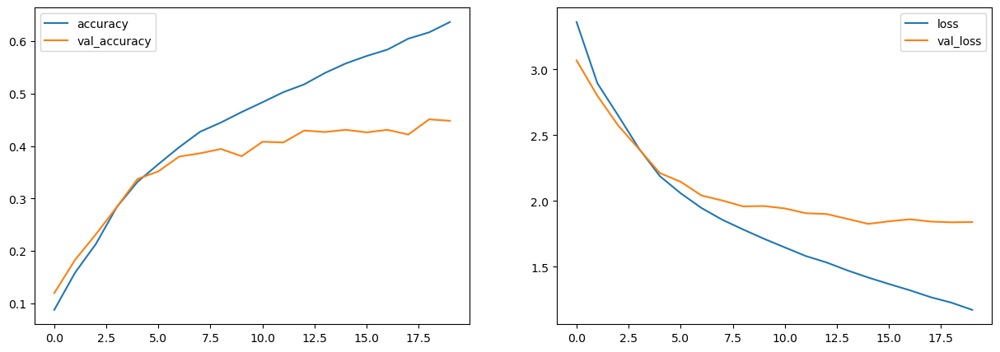

In [10]:
fig = plot_history(model)
fig.savefig(OUTPUT_FOLDER+f'history_lr_{LEARNING_RATE}_bs_{BATCH_SIZE}_ep_{EPOCHS}.png')

2023-10-30 17:10:21.048740: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-30 17:10:21.063122: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-30 17:10:21.063242: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

                        precision    recall  f1-score   support

    Albumen photograph       0.68      0.76      0.72        50
                Bronze       0.25      0.14      0.18        50
               Ceramic       0.51      0.44      0.47        50
                  Clay       0.44      0.42      0.43        50
             Engraving       0.24      0.26      0.25        50
               Etching       0.33      0.28      0.30        50
               Faience       0.66      0.62      0.64        50
                 Glass       0.25      0.34      0.29        50
                  Gold       0.55      0.64      0.59        50
              Graphite       0.58      0.72      0.64        50
Hand-colored engraving       0.62      0.80      0.70        50
  Hand-colored etching       0.62      0.66      0.64        50
                  Iron       0.46      0.66      0.54        50
                 Ivory       0.39      0.24      0.30        50
             Limestone       0.19      

,name,train_acc,val_acc,time_per_epoch_s
0,1 Conv 16 + 1 Dense 64,0.655172,0.448276,21


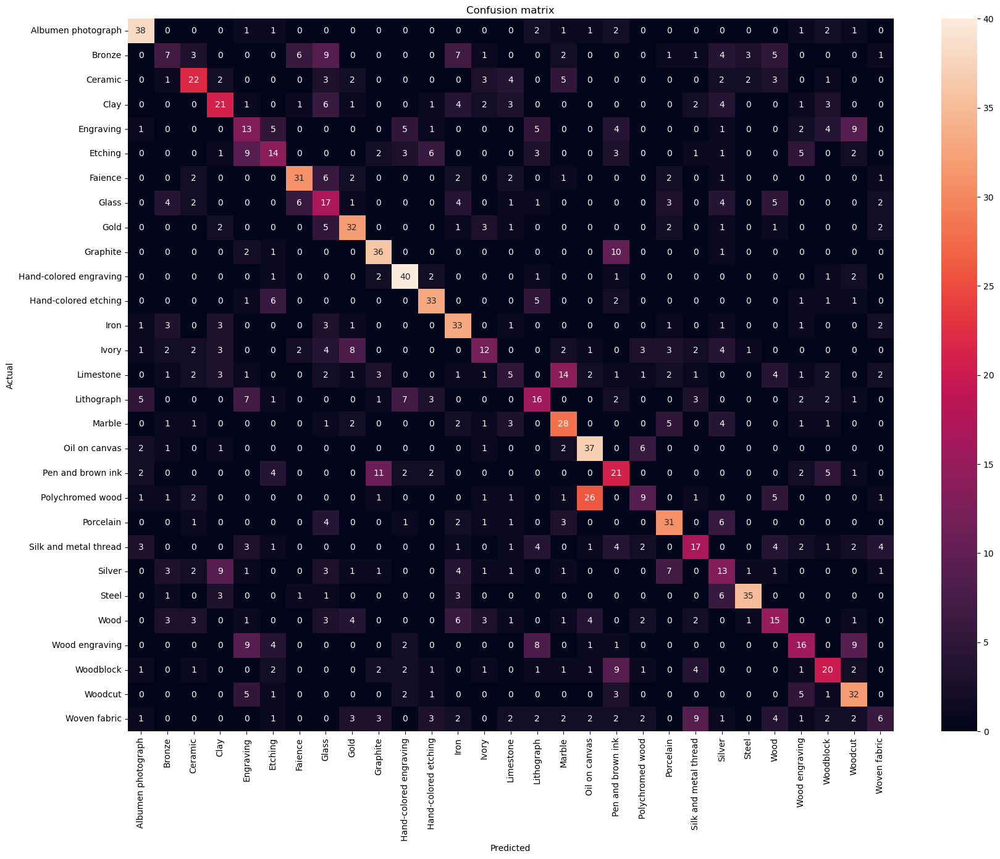

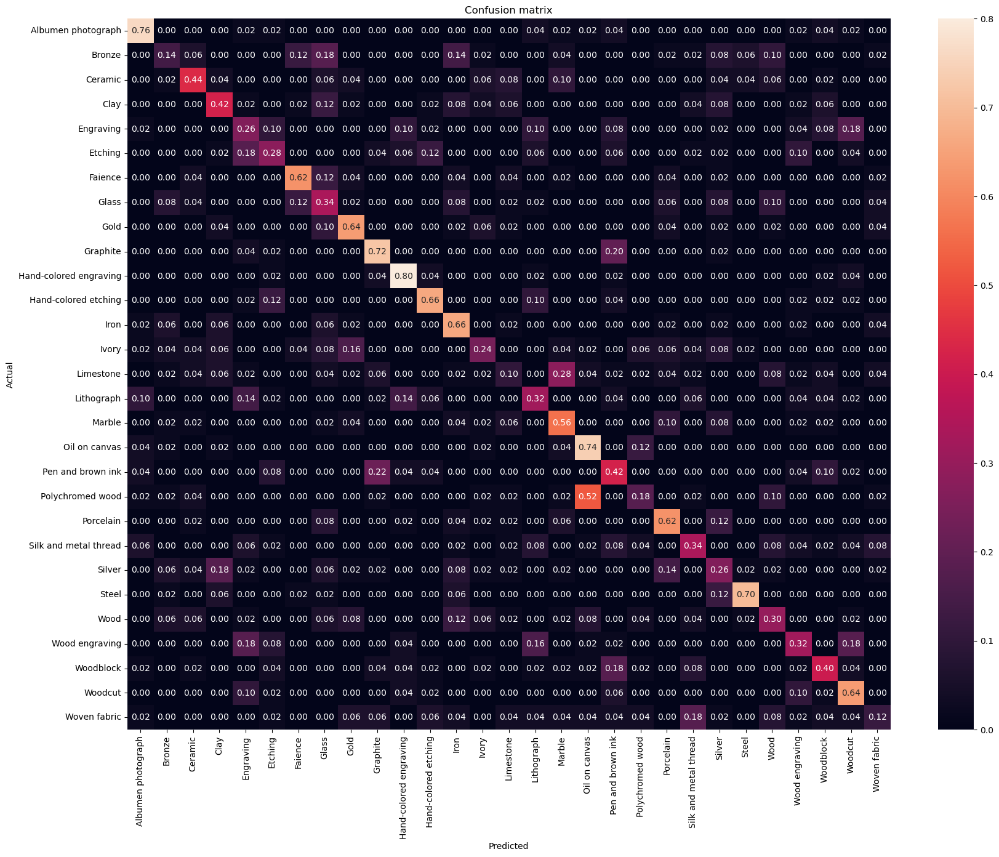

In [3]:
# model.save(OUTPUT_FOLDER+'model.h5')
model = keras.models.load_model(OUTPUT_FOLDER+'model.h5')

y_prob = model.predict(X_val, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

fig = plot_cm(y_val, y_pred, labels=config.LABELS)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix.jpg')

fig = plot_cm(y_val, y_pred, labels=config.LABELS, pct=True)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix_pct.jpg')

report = class_report(y_val, y_pred, out_path=OUTPUT_FOLDER)

acc_train = model.evaluate(X_train, y_train, verbose=0)[1]
acc_val = model.evaluate(X_val, y_val, verbose=0)[1]

d_results = {"name": "1 Conv 16 + 1 Dense 64",
             "train_acc": acc_train,
             "val_acc": acc_val,
             "time_per_epoch_s": 21}

df_results = pd.DataFrame(d_results, index=[0])
df_results.to_csv(OUTPUT_FOLDER+'metrics.csv', index=False)
df_results.head()

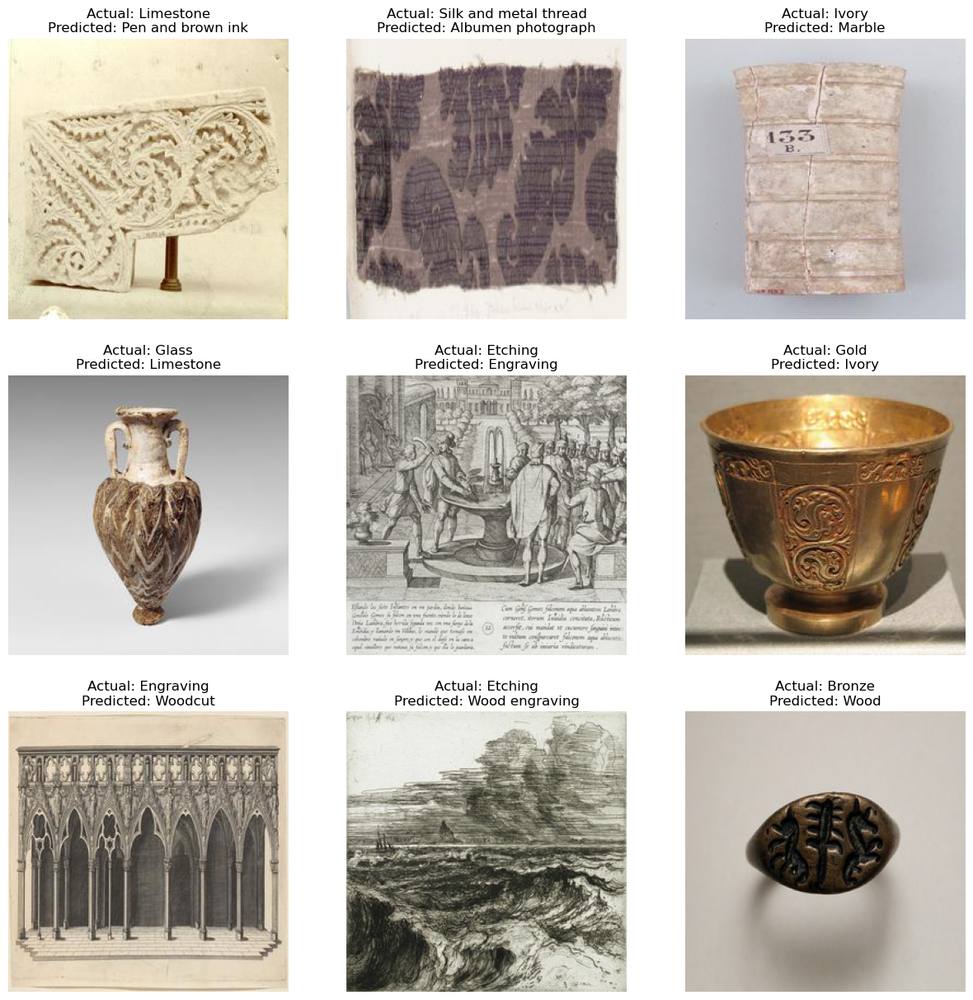

In [7]:
# Get the indices of wrong predictions
wrong_idx = np.where(y_val != y_pred)[0]

# Plot some of the wrong predictions
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, idx in enumerate(wrong_idx[:9]):
    img = X_val[idx]
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {config.LABELS[y_val[idx]]}\nPredicted: {config.LABELS[y_pred[idx]]}')
    ax[i//3, i%3].axis('off')
plt.show()


In [21]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 63504)             0         
                                                                 
 dense_4 (Dense)             (None, 64)                4064320   
                                                                 
 dense_5 (Dense)             (None, 29)                1885      
                                                      

In [23]:
Activations[1].shape

(1, 254, 254, 16)

In [14]:
[layer.name for layer in model.layers]

['rescaling_2',
 'conv2d_2',
 'max_pooling2d_2',
 'flatten_2',
 'dense_4',
 'dense_5']

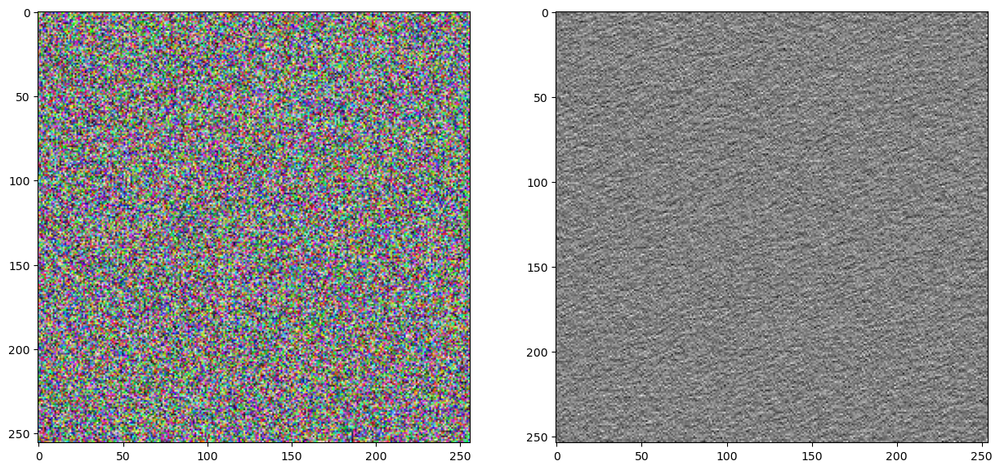

In [23]:
# Generate ramdom noise image and plot it

noise = np.random.random((config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS))
activations = get_layer_activations(noise, model)

fig, ax = plt.subplots(1,2, figsize=(15,15))
ax[0].imshow(noise)
activations = get_layer_activations(noise, model)
ax[1].imshow(activations[1][0, :,:, 10], cmap='gray')

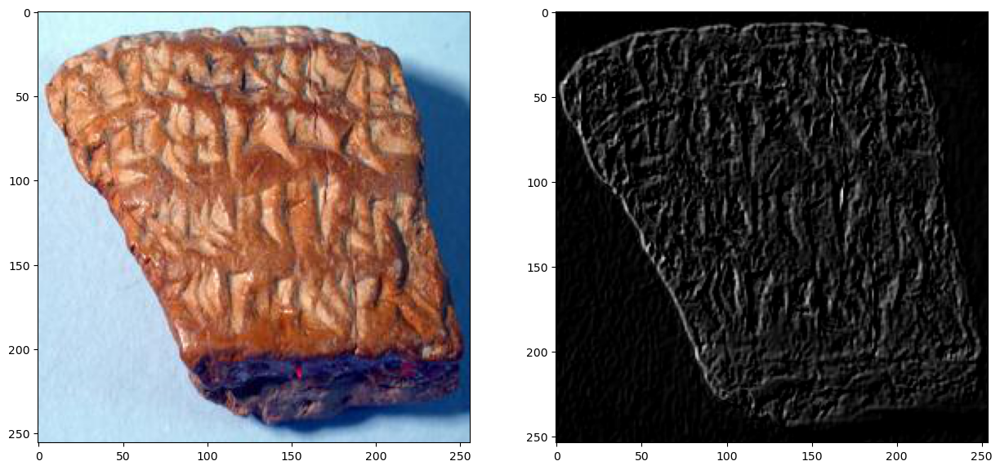

In [17]:
img = X_train[0]

fig, ax = plt.subplots(1,2, figsize=(15,15))
ax[0].imshow(img)
activations = get_layer_activations(img, model)
ax[1].imshow(activations[1][0, :,:, 0], cmap='gray')

1/1 [==============================] - 0s 30ms/step


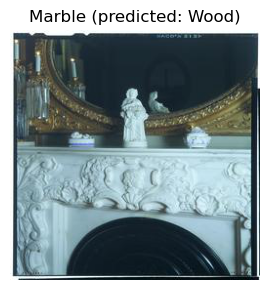

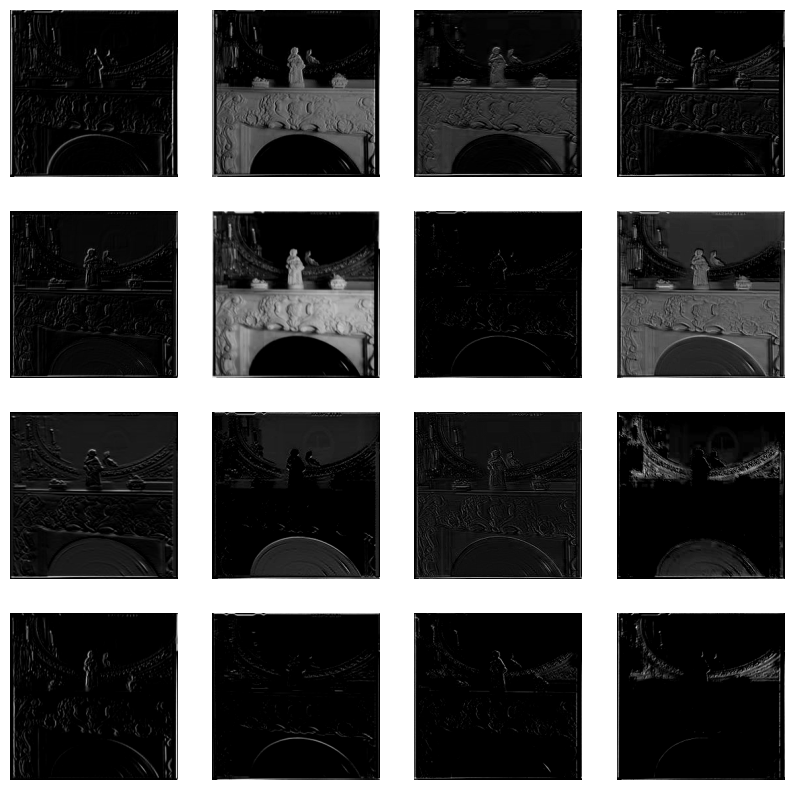

In [11]:
# Import model from kerasa
from keras.models import Model

k = 120
fig, ax = plt.subplots(1,1, figsize=(3, 3))
ax.imshow(X_train[k, :, :])
ax.set_title(f"{config.LABELS[y_train[k]]} (predicted: {config.LABELS[y_pred[k]]})")
ax.axis('off')
fig.tight_layout()

Image_Tensor = X_train[k, :, :].astype(float)
Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)
# Image_Tensor = Image_Tensor/255.0

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

fig, ax = plt.subplots(4, 4, figsize=(10, 10))
for i in range(4):
    for j in range(4):
        ax[i, j].imshow(Activations[1][0, :, :, i*4 + j], cmap='gray')
        ax[i, j].axis('off')
plt.show()

Some of the features extracted are still quite similar to the ones in the previous notebook. However, some of them are different. For example, the feature 1 is now focusing on the top left corner of the image, while the feature 2 is focusing on the bottom right corner. However, the features should be simpler.

In order to get simpler features, the number of units can be increased. Less spatial intensive model can be used as well. For example, some dilated convolutions can be used.

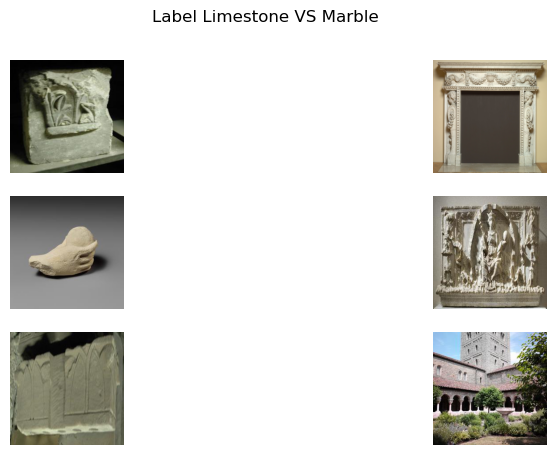

In [40]:
def plot_compare_classes(X, y, cat_name1, cat_name2, labels, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    fig, ax = plt.subplots(n_plots, 2, figsize=(10, 5))

    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        ax[i, 1].imshow(X_2[idx])
        ax[i, 1].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_classes(X_train, y_train, "Limestone", "Marble", labels=config.LABELS)

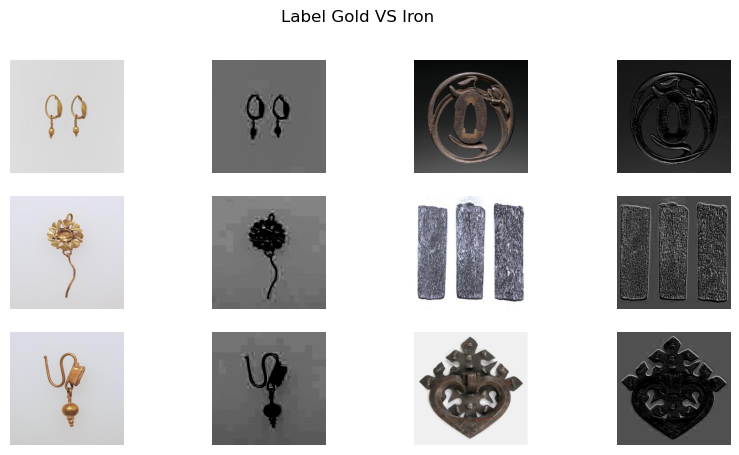

In [45]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

def plot_compare_activations(X, y, cat_name1, cat_name2, labels, model, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    
    fig, ax = plt.subplots(n_plots, 4, figsize=(10, 5))
    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        act_1 = get_layer_activations(X_1[idx], model)[1][0, :, :, 7]
        ax[i, 1].imshow(act_1, cmap='gray')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(X_2[idx])
        ax[i, 2].axis('off')

        act_2 = get_layer_activations(X_2[idx], model)[1][0, :, :, 7]
        ax[i, 3].imshow(act_2, cmap='gray')
        ax[i, 3].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_activations(X_train, y_train, "Gold", "Iron", model=model, labels=config.LABELS)

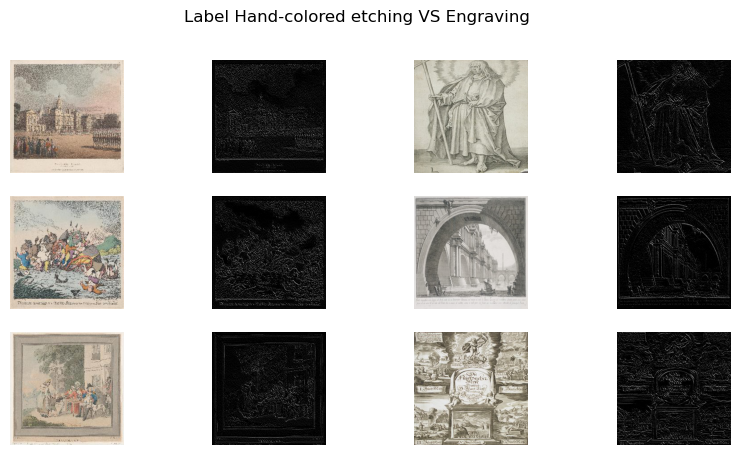

In [22]:
plot_compare_activations(X_train, y_train, "Hand-colored etching", "Engraving", model=model, labels=labels)

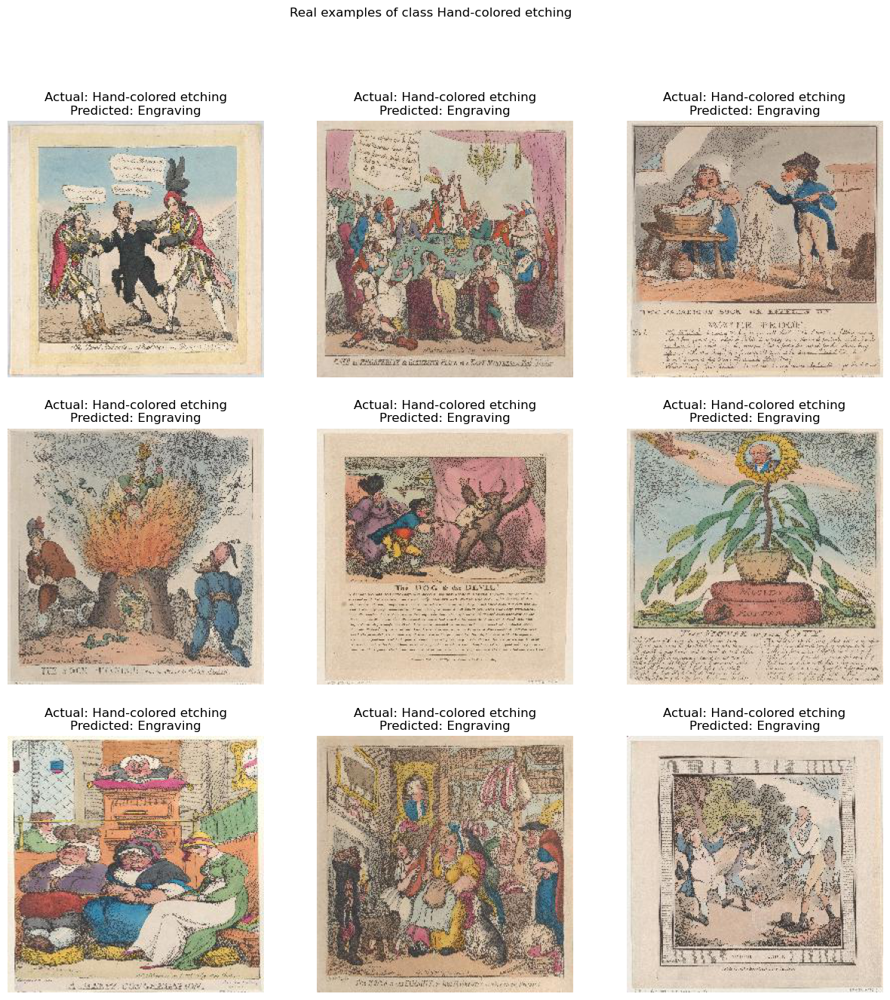

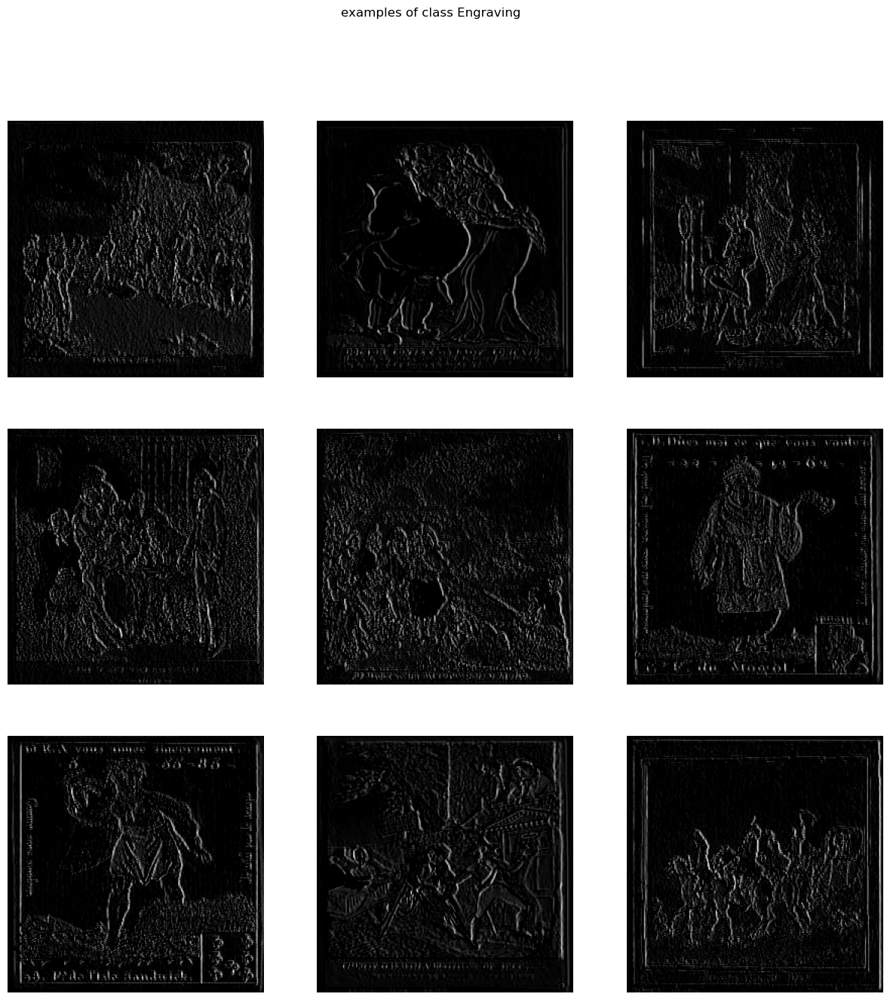

Text(0.5, 0.98, 'examples of class 4')

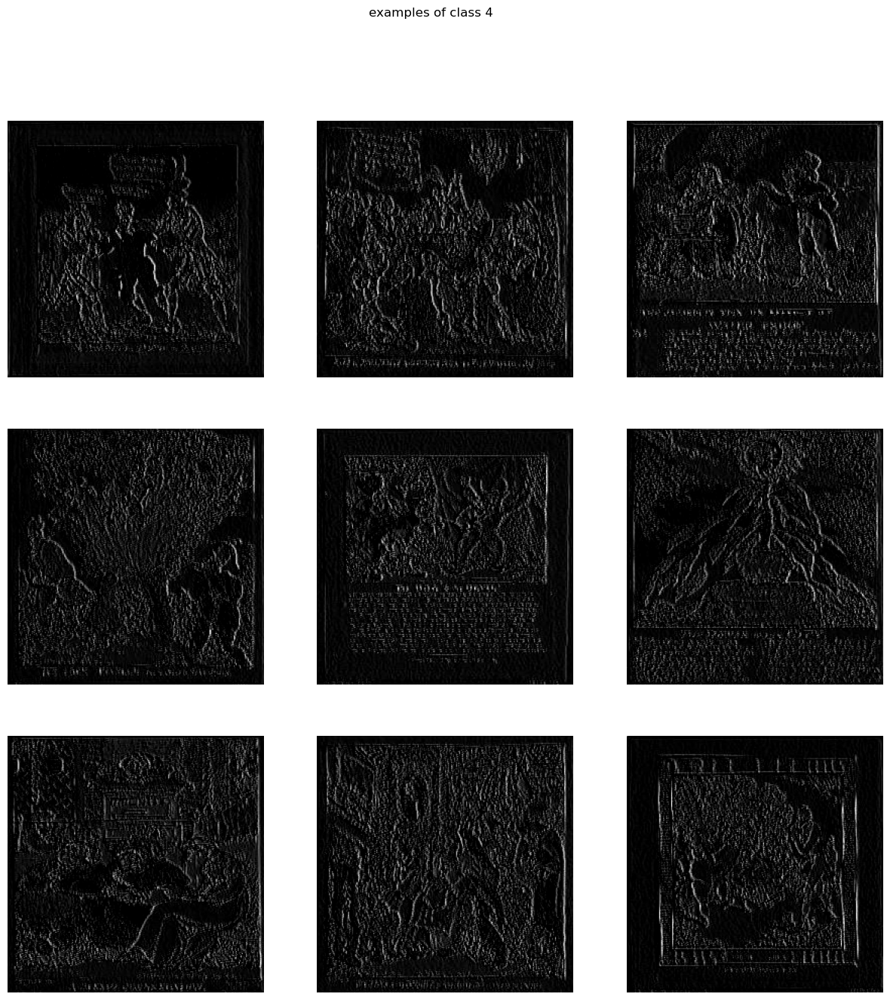

In [26]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

cat_pred_name = 'Engraving'
cat_real_name = 'Hand-colored etching'

cat_pred = labels.index(cat_pred_name)
cat_real = labels.index(cat_real_name)
X_wrong = X_train[(y_train == cat_real)&(y_pred == cat_pred)]    


# Print examples of the misclassified
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {labels[cat_real]}\nPredicted: {labels[cat_pred]}')
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real_name}")
plt.show()

# Show the activations of the real class
X_real = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_real[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"examples of class {cat_pred_name}")
plt.show()

# SHow the activations of the class supposed by the model

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")

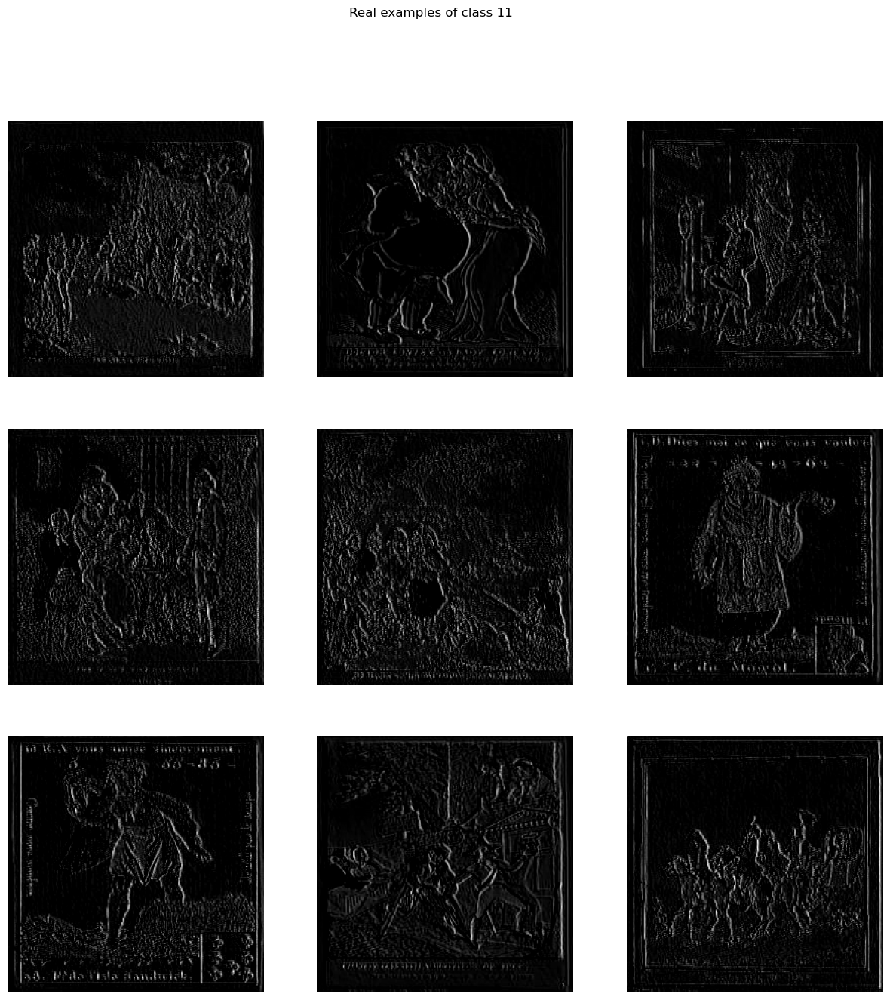

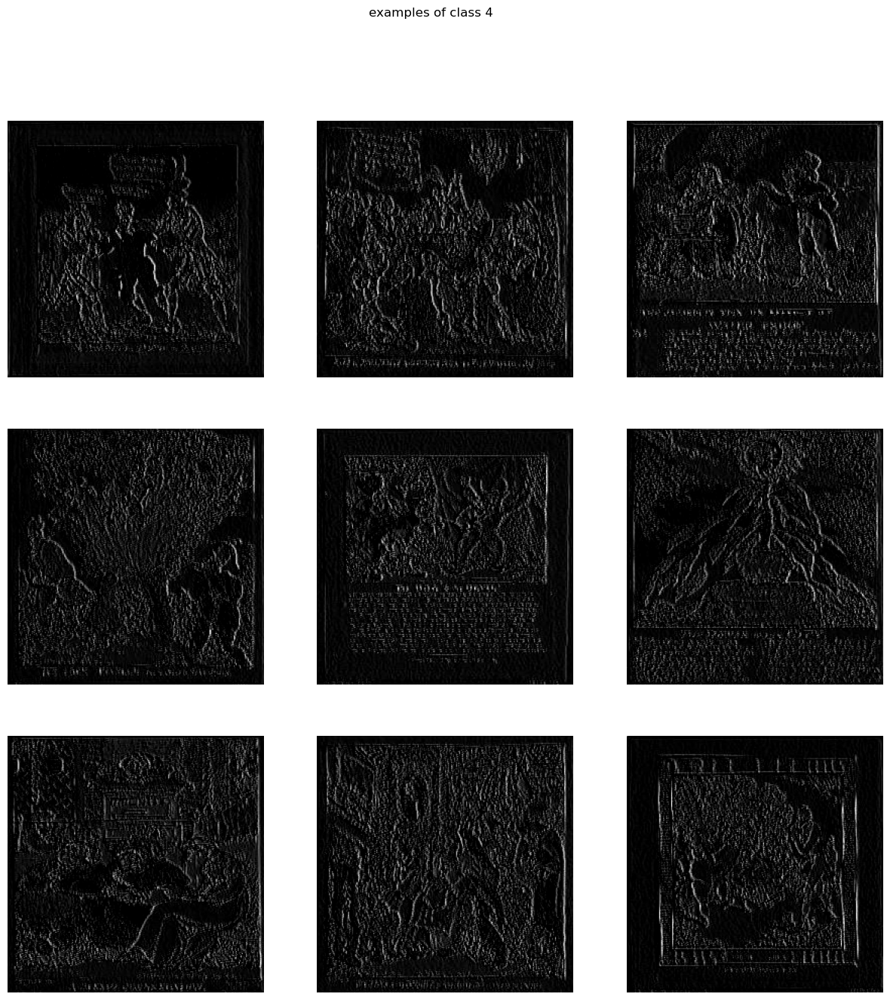

In [23]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

X_ivory = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_ivory[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real}")
plt.show()

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")
plt.show()

1/1 [==============================] - 0s 30ms/step


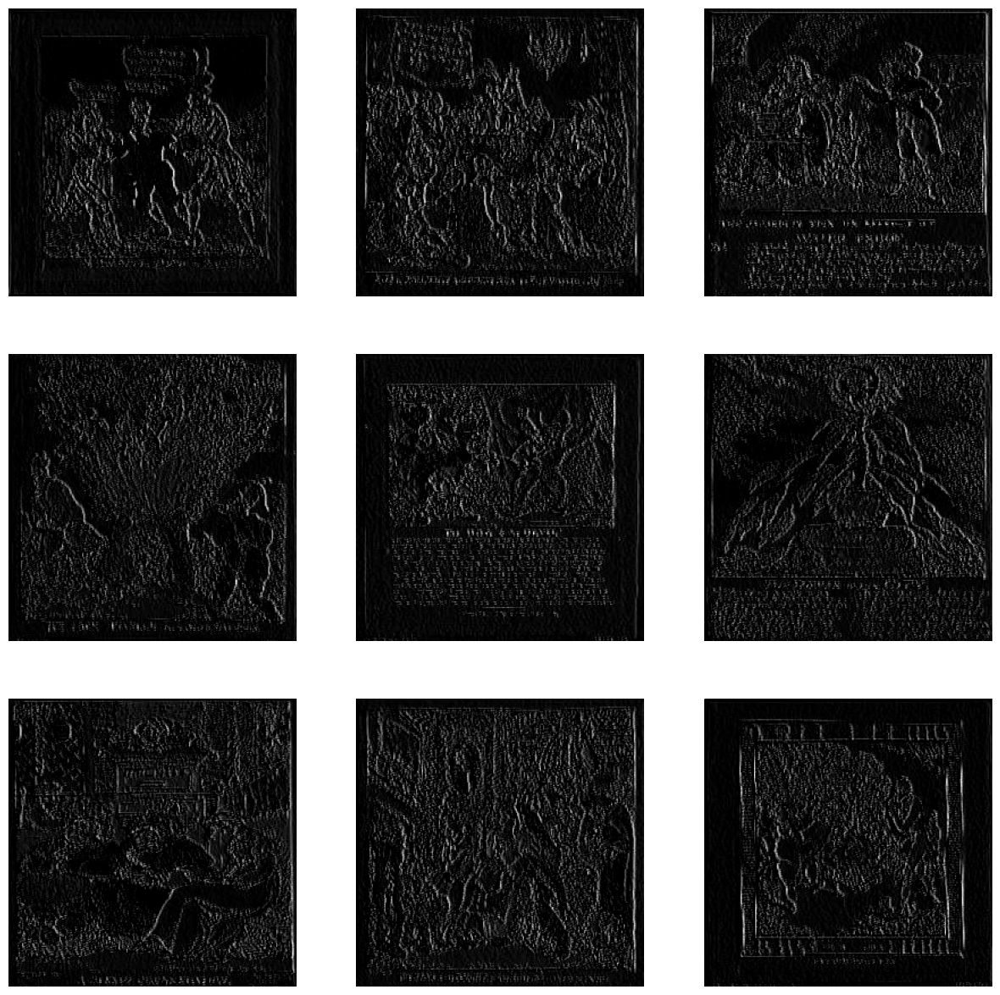

In [19]:
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')